## Ex1: Introduction to Image Analysis

In [1]:
from skimage import color, io, measure, img_as_ubyte
from skimage.measure import profile_line
from skimage.transform import rescale, resize
import matplotlib.pyplot as plt
import numpy as np
import pydicom as dicom

In [2]:
# Directory containing data and images
in_dir = "data/"

# X-ray image
im_name = "metacarpals.png"

# Read the image.
# Here the directory and the image name is concatenated
# by "+" to give the full path to the image.
im_org = io.imread(in_dir + im_name)

In [3]:
print(im_org.shape)
print(im_org.dtype)

(512, 512)
uint8


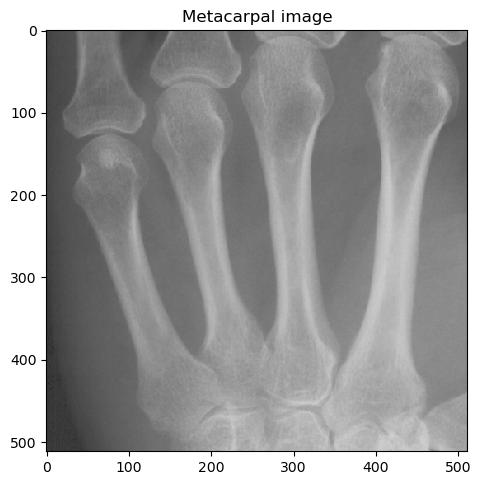

In [4]:
io.imshow(im_org)
plt.title('Metacarpal image')
io.show()

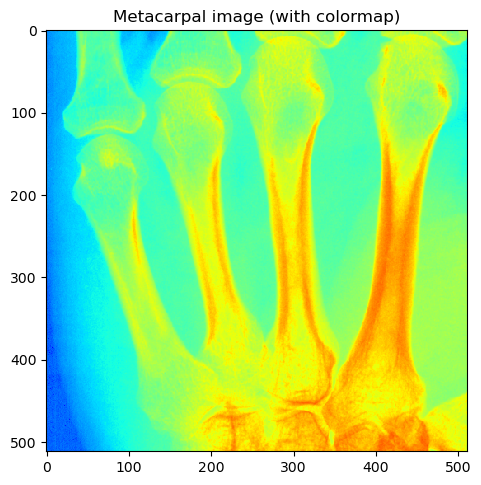

In [5]:
# display an image using colormap
# more colormap options are available
io.imshow(im_org, cmap="jet")
plt.title('Metacarpal image (with colormap)')
io.show()

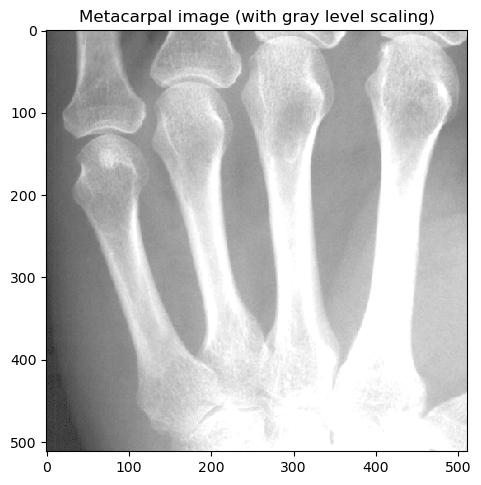

In [6]:
# pixels with vmin are visualized black, vmin visualised white
io.imshow(im_org, vmin=20, vmax=170)
plt.title('Metacarpal image (with gray level scaling)')
io.show()

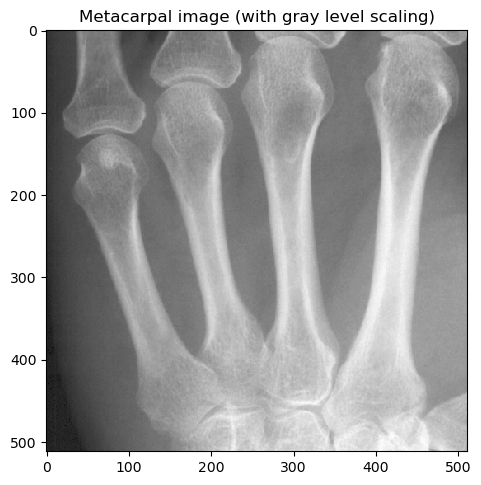

In [7]:
# automate the scaling of visualisation
io.imshow(im_org, vmin = im_org.min(), vmax = im_org.max())
plt.title('Metacarpal image (with gray level scaling)')
io.show()

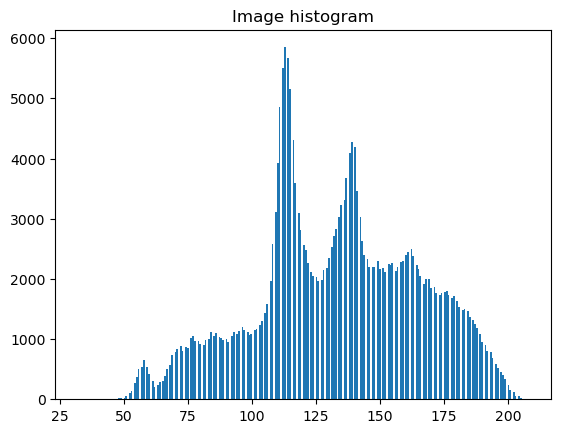

In [8]:
# ravel() converts image into a 1D array for histogran
plt.hist(im_org.ravel(), bins=256)
plt.title('Image histogram')
io.show()

There are 1147.0 pixel values in bin 100
Bin edges: 100.75 to 101.4375


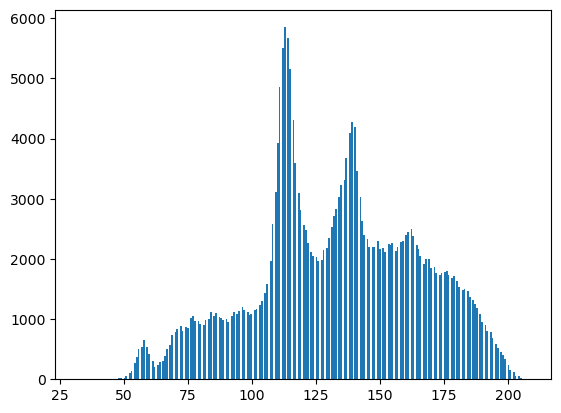

In [9]:
# h contains a list of tuples: (bin count, bin edge)
h = plt.hist(im_org.ravel(), bins=256)

bin_no = 100
count = h[0][bin_no]
print(f"There are {count} pixel values in bin {bin_no}")

bin_left = h[1][bin_no]
bin_right = h[1][bin_no + 1]
print(f"Bin edges: {bin_left} to {bin_right}")

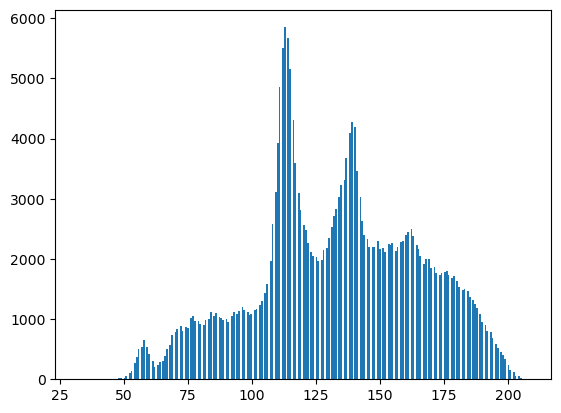

In [10]:
# alternative way to call histogram()
y, x, _ = plt.hist(im_org.ravel(), bins=256)
# print(y) # bin count
# print(x) # bin edges

In [11]:
# obtain value of specified pixel
r = 100
c = 50
im_val = im_org[r, c]
print(f"The pixel value at (r,c) = ({r}, {c}) is: {im_val}")

r = 110
c = 90
im_val = im_org[r, c]
print(f"The pixel value at (r,c) = ({r}, {c}) is: {im_val}")

The pixel value at (r,c) = (100, 50) is: 108
The pixel value at (r,c) = (110, 90) is: 120


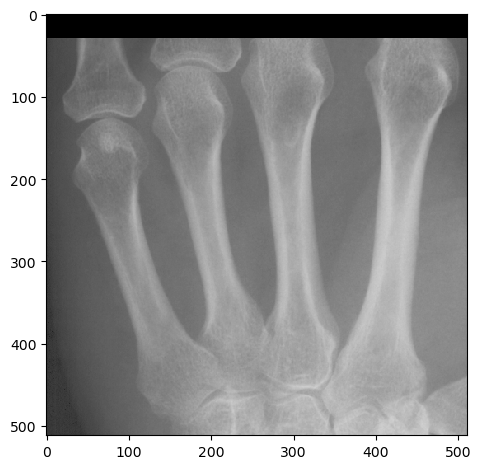

In [12]:
# pixel (0,0) is at the top left of img
# numpy slicing: set pixels of top 30 rows to be 0
im_org[:30] = 0
io.imshow(im_org)
io.show()

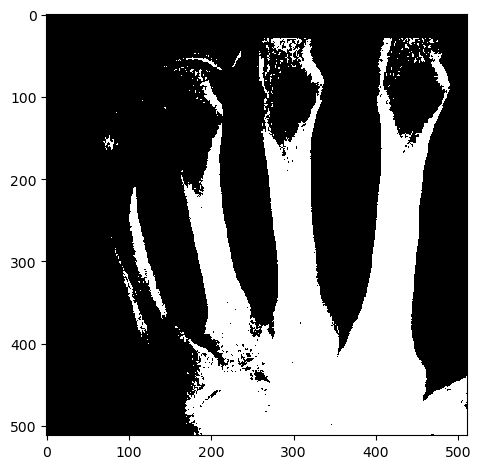

In [13]:
# thresholding
# pixel values > 150 become 1
# while values <= 150 become 0
mask = im_org > 150

io.imshow(mask)
io.show()

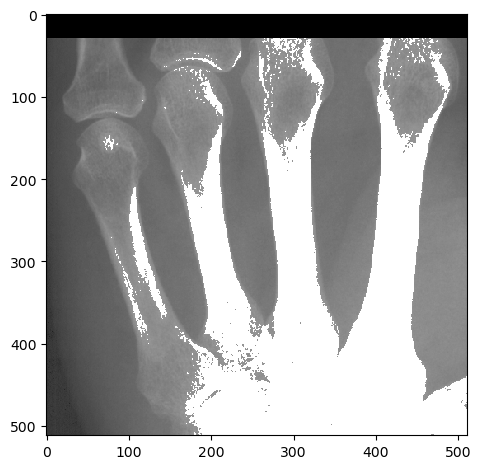

In [14]:
im_org[mask] = 255
# all true elements become 255
io.imshow(im_org)
io.show()

In [15]:
im_name = "ardeche.jpg"
im_org = io.imread(in_dir + im_name)
# print(im_org.shape)
rows = im_org.shape[0]
cols = im_org.shape[1]
print("rows: {}".format(rows))
print("cols: {}".format(cols))
# print(im_org.dtype)

# assign a (R,G,B) to a pixel
r = 110
c = 90
im_org[r, c] = [255, 0, 0]

rows: 600
cols: 800


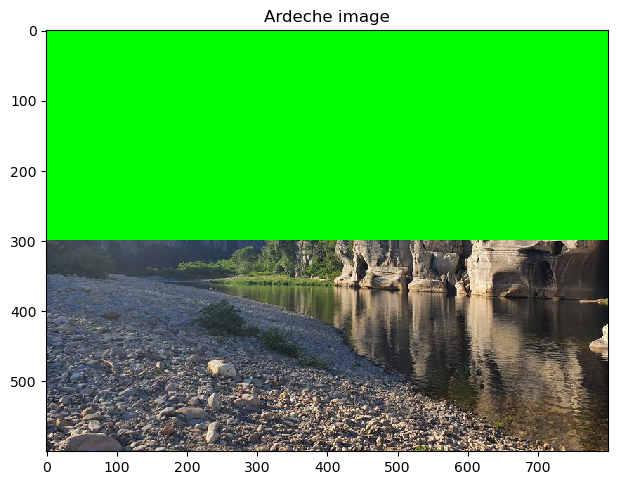

In [16]:
# color upperhalf of the photo green using np slicing
im_org[0:rows//2, ] = [0, 255, 0]
io.imshow(im_org)
plt.title('Ardeche image')
io.show()

uint8
float64


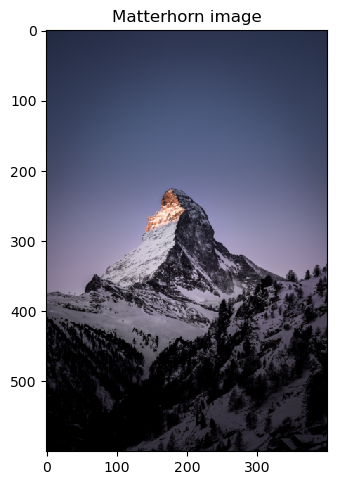

In [17]:
im_name = "Matterhorn.jpg"
im_org = io.imread(in_dir + im_name)
cols = im_org.shape[1]
print(im_org.dtype)

# automate rescaling to have resulting width always equal to 400
image_rescaled = rescale(im_org, 400/cols, anti_aliasing=True,
                         channel_axis=2)
print(image_rescaled.dtype)

io.imshow(image_rescaled)
plt.title('Matterhorn image')
io.show()

float64
uint8


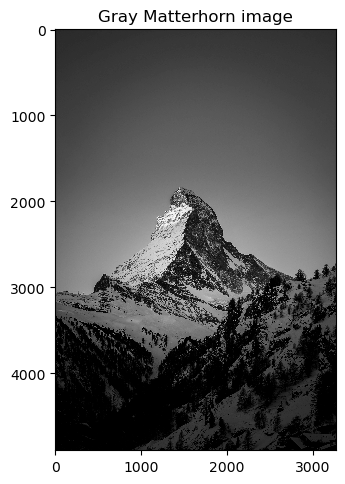

In [18]:
# transform to gray-level img
im_gray = color.rgb2gray(im_org)
print(im_gray.dtype)

# force pixel type into unsigned bytes
im_byte = img_as_ubyte(im_gray)
print(im_byte.dtype)

io.imshow(im_byte)
plt.title('Gray Matterhorn image')
io.show()

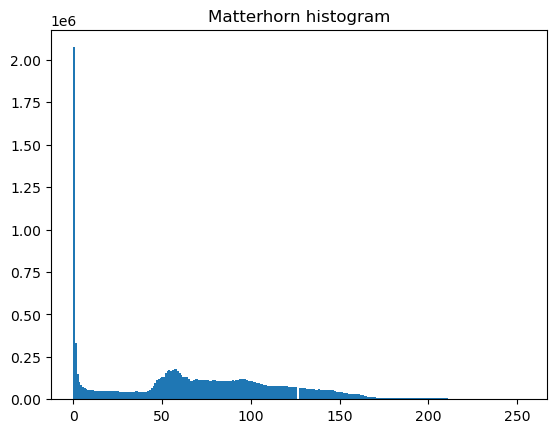

In [19]:
plt.hist(im_byte.ravel(), bins=256)
plt.title('Matterhorn histogram')
io.show()

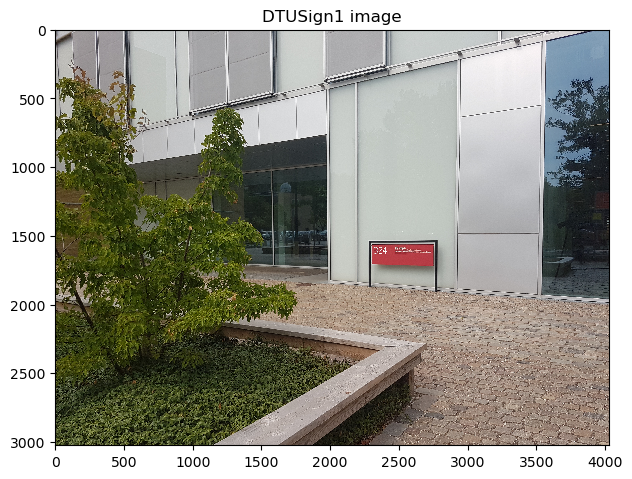

In [20]:
im_name = "DTUSign1.jpg"
im_org = io.imread(in_dir + im_name)
io.imshow(im_org)
plt.title('DTUSign1 image')
io.show()

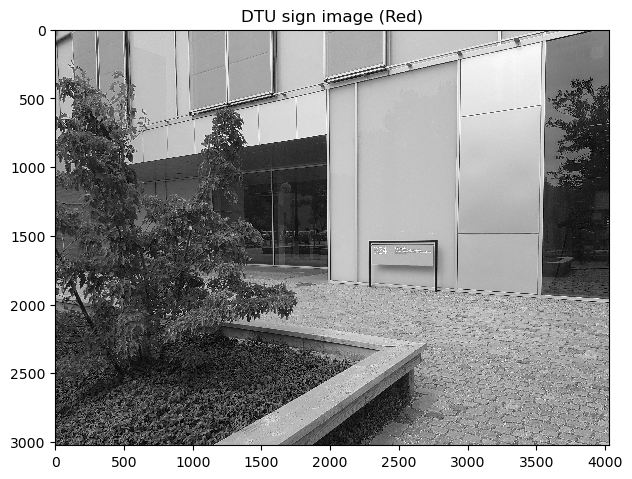

In [21]:
# visualise red component of img
r_comp = im_org[:, :, 0]
io.imshow(r_comp)
plt.title('DTU sign image (Red)')
io.show()

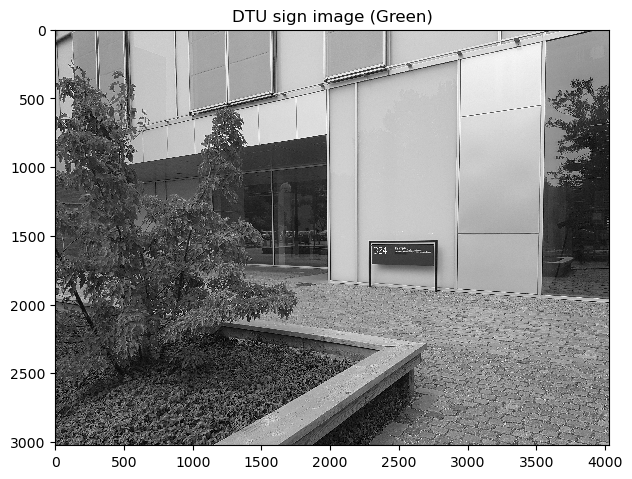

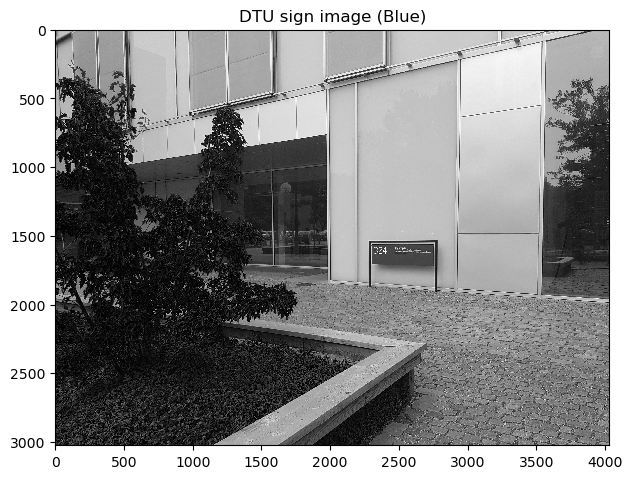

In [22]:
# visualise green component of img
g_comp = im_org[:, :, 1]
io.imshow(g_comp)
plt.title('DTU sign image (Green)')
io.show()

# visualise blue component of img
b_comp = im_org[:, :, 2]
io.imshow(b_comp)
plt.title('DTU sign image (Blue)')
io.show()

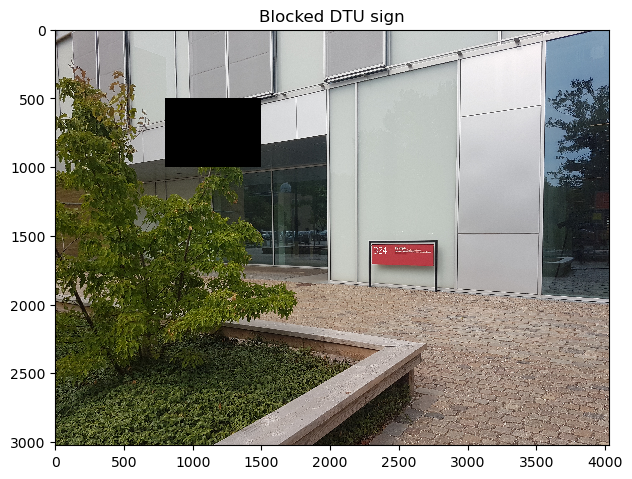

In [23]:
# create a black rectangle in img
im_org[500:1000, 800:1500, :] = 0
io.imshow(im_org)
plt.title('Blocked DTU sign')
io.show()

In [24]:
# save the img to folder
io.imsave("data/Blocked_DTUSign.jpg", im_org)

im_org[500:1000, 800:1500, :] = [0, 0, 255]
io.imsave("data/Blocked_DTUSign_blue.jpg", im_org)


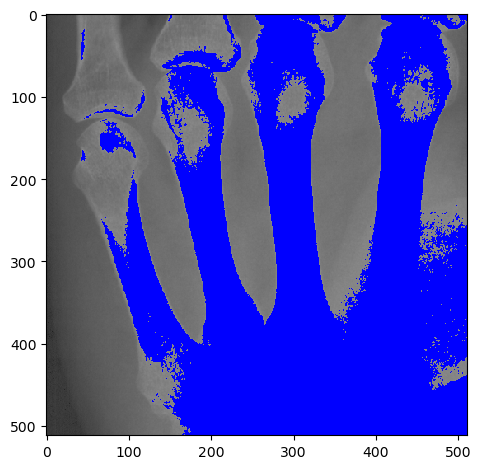

In [25]:
# make the bone in the image appear blue
im_name = "metacarpals.png"
im_org = io.imread(in_dir + im_name)

# thresholding
mask = im_org > 135
im_rgb = color.gray2rgb(im_org)
im_rgb[mask, :] = 0  
# changes are only made to the TRUE values of mask
# non-bone pixels are not affected
# make RGB channels of bones all 0

# print(im_rgb)
im_rgb[mask, 2] = 255 # make B channgel of bones 255
# print(im_rgb)

io.imshow(im_rgb)
# plt.title('Blue Metacarpals')
io.show()


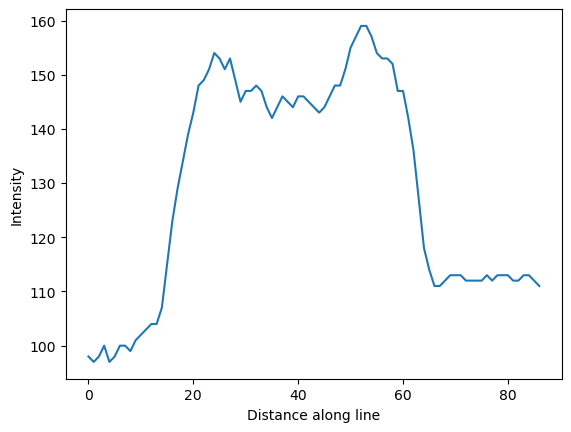

In [26]:
# sample a profile across the img
p = profile_line(im_org, (342, 77), (320, 160))
plt.plot(p)
plt.ylabel('Intensity')
plt.xlabel('Distance along line')
plt.show()

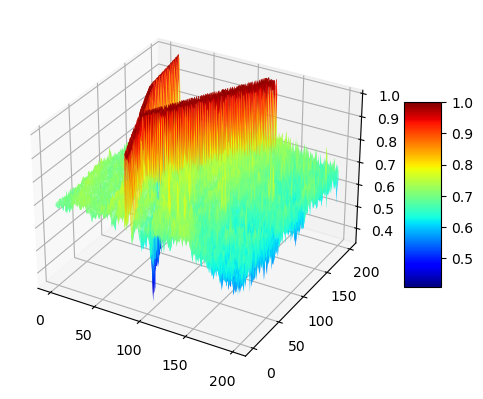

In [27]:
# 3D view of pixel values, where height = gray level
in_dir = "data/"
im_name = "road.png"
im_org = io.imread(in_dir + im_name)
im_gray = color.rgb2gray(im_org)
ll = 200
im_crop = im_gray[40:40 + ll, 150:150 + ll]
xx, yy = np.mgrid[0:im_crop.shape[0], 0:im_crop.shape[1]]
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})
surf = ax.plot_surface(xx, yy, im_crop, rstride=1, cstride=1, cmap=plt.cm.jet,
                       linewidth=0)
fig.colorbar(surf, shrink=0.5, aspect=5)

# %matplotlib notebook 

plt.show()


In [28]:
# read a dicom file
in_dir = "data/"
im_name = "1-442.dcm"
ds = dicom.dcmread(in_dir + im_name)
print(ds)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 174
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 61.7.148187188172271071649499494197343400503
(0002, 0010) Transfer Syntax UID                 UI: Implicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.40.0.13.1.1.1
(0002, 0013) Implementation Version Name         SH: 'dcm4che-1.4.34'
-------------------------------------------------
(0008, 0008) Image Type                          CS: ['DERIVED', 'SECONDARY']
(0008, 0016) SOP Class UID                       UI: CT Image Storage
(0008, 0018) SOP Instance UID                    UI: 61.7.148187188172271071649499494197343400503
(0008, 0020) Study Date                          DA: '20140914'
(0008, 0030) Study Time                          TM: ''
(0008, 0050) Accession N

In [29]:
im = ds.pixel_array

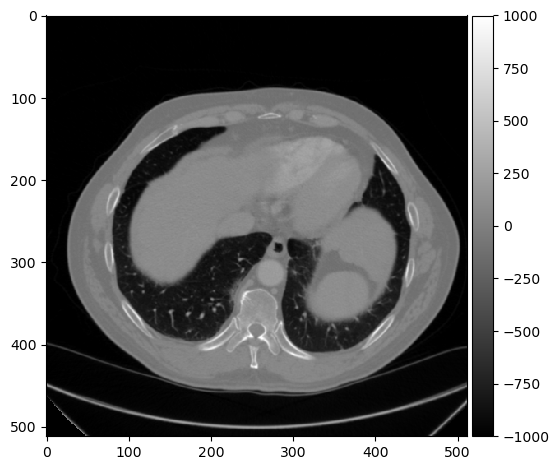

In [30]:
io.imshow(im, vmin=-1000, vmax=1000, cmap='gray')
io.show()

## Ex2: Introduction to Principal Component Analysis

In [31]:
import numpy as np

in_dir = "data/"
txt_name = "irisdata.txt"
iris_data = np.loadtxt(in_dir + txt_name, comments="%")
# x is a matrix with 50 rows and 4 columns
x = iris_data[0:50, 0:4]

# Check matric dimensions
n_feat = x.shape[1]   # columns
n_obs = x.shape[0]    # rows
print(f"Number of features: {n_feat} and number of observations: {n_obs}")

x

Number of features: 4 and number of observations: 50


array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

In [32]:
sep_l = x[:, 0]
sep_w = x[:, 1]
pet_l = x[:, 2]
pet_w = x[:, 3]

# Use ddof = 1 to make an unbiased estimate (divides by N-1)
var_sep_l = sep_l.var(ddof=1)
var_sep_w = sep_w.var(ddof=1)
var_pet_l = pet_l.var(ddof=1)
var_pet_w = pet_w.var(ddof=1)

In [33]:
sep_l

array([5.1, 4.9, 4.7, 4.6, 5. , 5.4, 4.6, 5. , 4.4, 4.9, 5.4, 4.8, 4.8,
       4.3, 5.8, 5.7, 5.4, 5.1, 5.7, 5.1, 5.4, 5.1, 4.6, 5.1, 4.8, 5. ,
       5. , 5.2, 5.2, 4.7, 4.8, 5.4, 5.2, 5.5, 4.9, 5. , 5.5, 4.9, 4.4,
       5.1, 5. , 4.5, 4.4, 5. , 5.1, 4.8, 5.1, 4.6, 5.3, 5. ])

In [34]:
# Calculate covariance using formula

cov_x = np.zeros([50,4])
cov_mat = np.zeros([6])

# subtract mean of variable from each data point
for i in range(n_feat):
    cov_x[:, i] = x[:, i] - np.mean(x,0)[i]

for i in range(n_obs):    
    cov_mat[0] += cov_x[i, 0]*cov_x[i, 1]
    cov_mat[1] += cov_x[i, 0]*cov_x[i, 2]
    cov_mat[2] += cov_x[i, 0]*cov_x[i, 3]
    cov_mat[3] += cov_x[i, 1]*cov_x[i, 2]
    cov_mat[4] += cov_x[i, 1]*cov_x[i, 3]
    cov_mat[5] += cov_x[i, 2]*cov_x[i, 3]

for i in range(6):
    cov_mat[i] = cov_mat[i]/(n_obs-1)

print("cov sep_1 sep_w: ", cov_mat[0])
print("cov sep_1 pet_l: ", cov_mat[1])
print("cov sep_1 pet_w: ", cov_mat[2])
print("cov sep_w pet_l: ", cov_mat[3])
print("cov sep_w pet_w: ", cov_mat[4])
print("cov pet_1 pet_w: ", cov_mat[5])    


print("\nvar sep_l: ", var_sep_l)
print("var sep_w: ", var_sep_w)
print("var pet_l: ", var_pet_l)
print("var pet_l: ", var_pet_w)

covariance = np.cov(x.transpose())
print("\n Using numpy covariance: \n", covariance)

# Covariance values lie between -1 to 1

cov sep_1 sep_w:  0.09921632653061219
cov sep_1 pet_l:  0.01635510204081632
cov sep_1 pet_w:  0.01033061224489795
cov sep_w pet_l:  0.01169795918367346
cov sep_w pet_w:  0.009297959183673474
cov pet_1 pet_w:  0.006069387755102041

var sep_l:  0.12424897959183677
var sep_w:  0.1436897959183674
var pet_l:  0.030159183673469384
var pet_l:  0.01110612244897959

 Using numpy covariance: 
 [[0.12424898 0.09921633 0.0163551  0.01033061]
 [0.09921633 0.1436898  0.01169796 0.00929796]
 [0.0163551  0.01169796 0.03015918 0.00606939]
 [0.01033061 0.00929796 0.00606939 0.01110612]]


<Figure size 640x480 with 0 Axes>

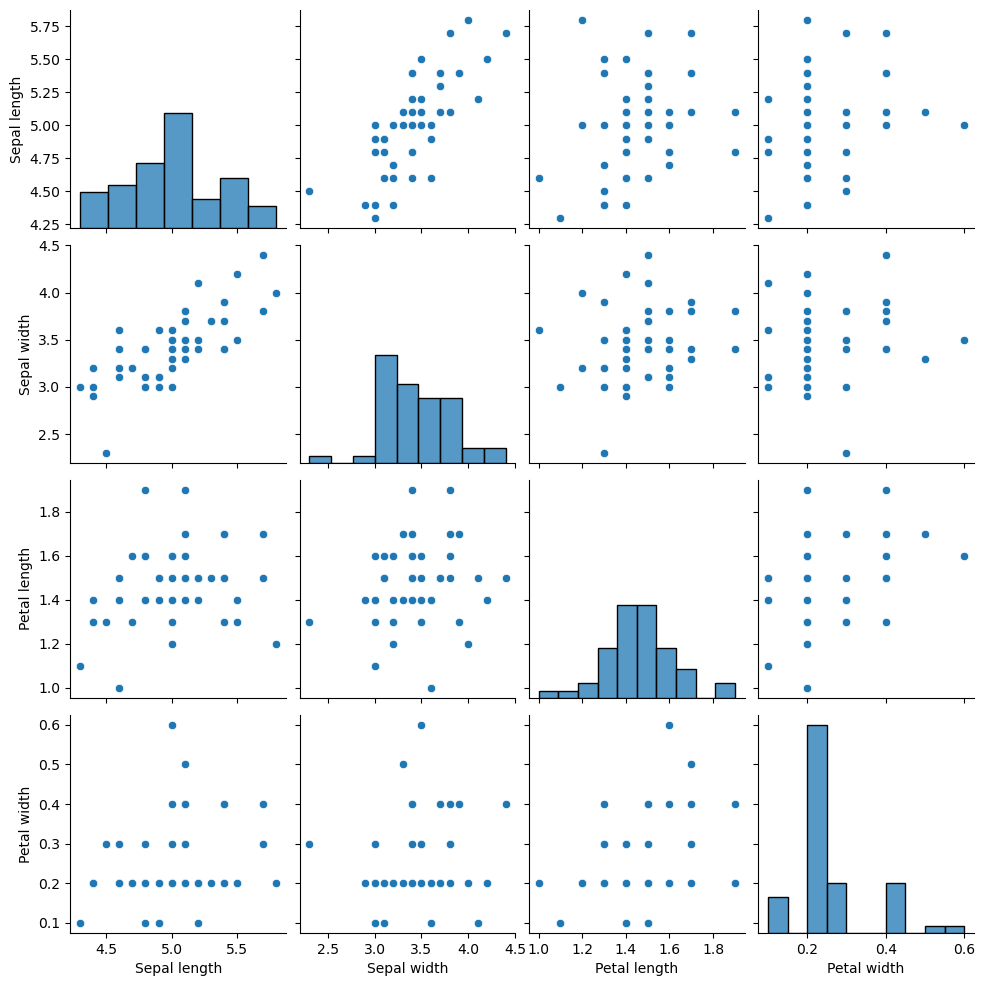

(50, 4)

In [35]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

plt.figure() # Added this to make sure that the figure appear
# Transform the data into a Pandas dataframe
d = pd.DataFrame(x, columns=['Sepal length', 'Sepal width',
							 'Petal length', 'Petal width'])
sns.pairplot(d)
plt.show()
x.shape

# Sepal length and sepal width are related 
# because the covariance value is pretty high

In [36]:
# Breakdown of PCA Analaysis using several steps
mn = np.mean(x, axis=0)
data = x - mn

c_x = 1/(n_obs-1)*np.matmul(data.transpose(),data)
print("Cx: \n", c_x)
print("np.cov: \n", covariance)

Cx: 
 [[0.12424898 0.09921633 0.0163551  0.01033061]
 [0.09921633 0.1436898  0.01169796 0.00929796]
 [0.0163551  0.01169796 0.03015918 0.00606939]
 [0.01033061 0.00929796 0.00606939 0.01110612]]
np.cov: 
 [[0.12424898 0.09921633 0.0163551  0.01033061]
 [0.09921633 0.1436898  0.01169796 0.00929796]
 [0.0163551  0.01169796 0.03015918 0.00606939]
 [0.01033061 0.00929796 0.00606939 0.01110612]]


v_norm:  [76.47237023 11.93992401  8.66624997  2.92145579]


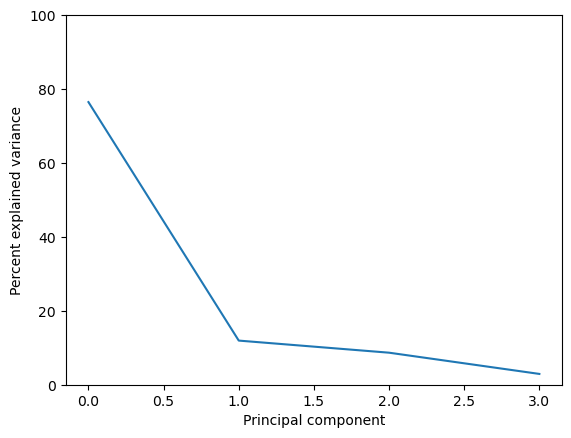

In [37]:
values, vectors = np.linalg.eig(c_x) # Here c_x is your covariance matrix.

v_norm = values / values.sum() * 100
print("v_norm: ", v_norm)
plt.plot(v_norm)
plt.xlabel('Principal component')
plt.ylabel('Percent explained variance')
plt.ylim([0, 100])

plt.show()

# The first feature explains 76% of the total variation

In [38]:
# Project data onto PCA space using dot-product
pc_proj = vectors.T.dot(data.T)
pc_proj.shape
# pc_proj.transpose()

(4, 50)

<Figure size 640x480 with 0 Axes>

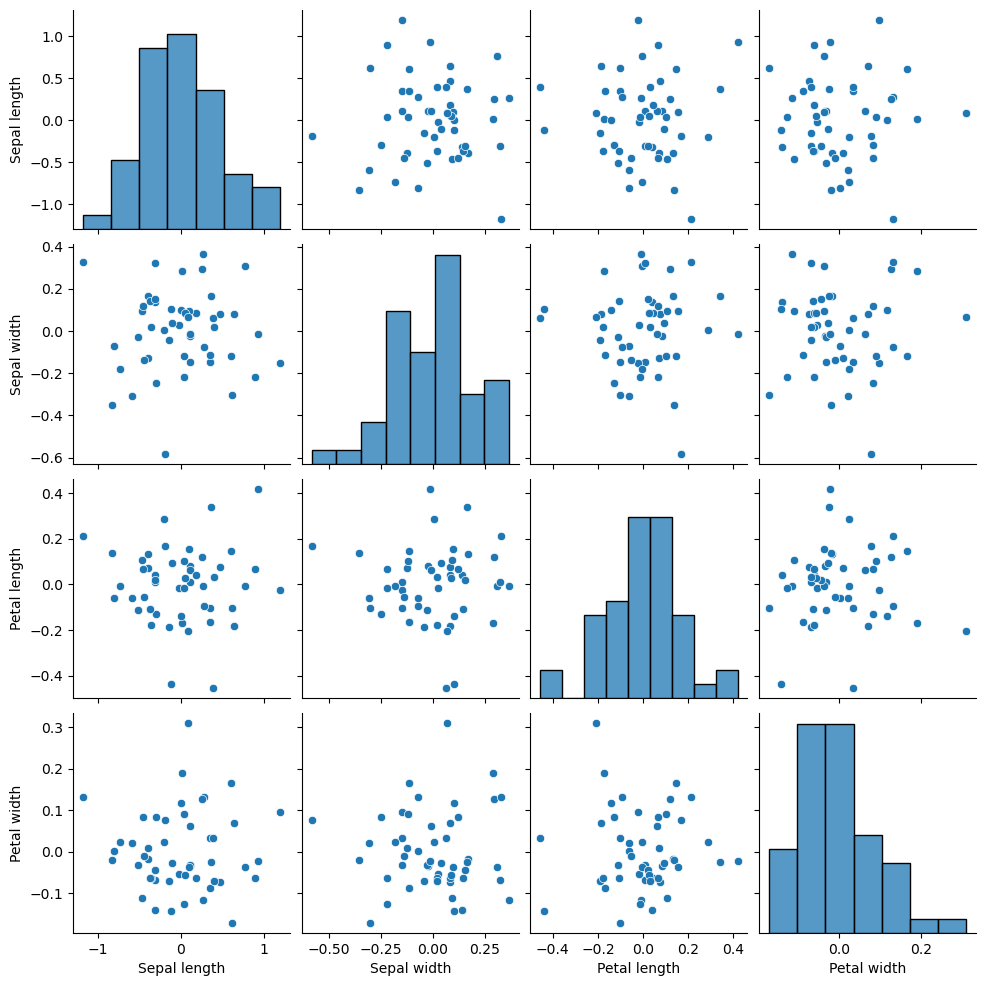

In [39]:
# Using seaborns pairplot with projected data
plt.figure() # Added this to make sure that the figure appear
# Transform the data into a Pandas dataframe
d = pd.DataFrame(pc_proj.transpose(), 
                 columns=['Sepal length', 'Sepal width',
                          'Petal length', 'Petal width'])
sns.pairplot(d)
plt.show()

In [40]:
# Direct PCA using the decompositions functions

from sklearn import decomposition

pca = decomposition.PCA()
pca.fit(x)
values_pca = pca.explained_variance_
exp_var_ratio = pca.explained_variance_ratio_
vectors_pca = pca.components_

data_transform = pca.transform(data)
print("shape: ", data_transform.shape)

covariance = np.cov(x.transpose())
print("\n Using numpy covariance: \n", covariance)

shape:  (50, 4)

 Using numpy covariance: 
 [[0.12424898 0.09921633 0.0163551  0.01033061]
 [0.09921633 0.1436898  0.01169796 0.00929796]
 [0.0163551  0.01169796 0.03015918 0.00606939]
 [0.01033061 0.00929796 0.00606939 0.01110612]]


<Figure size 640x480 with 0 Axes>

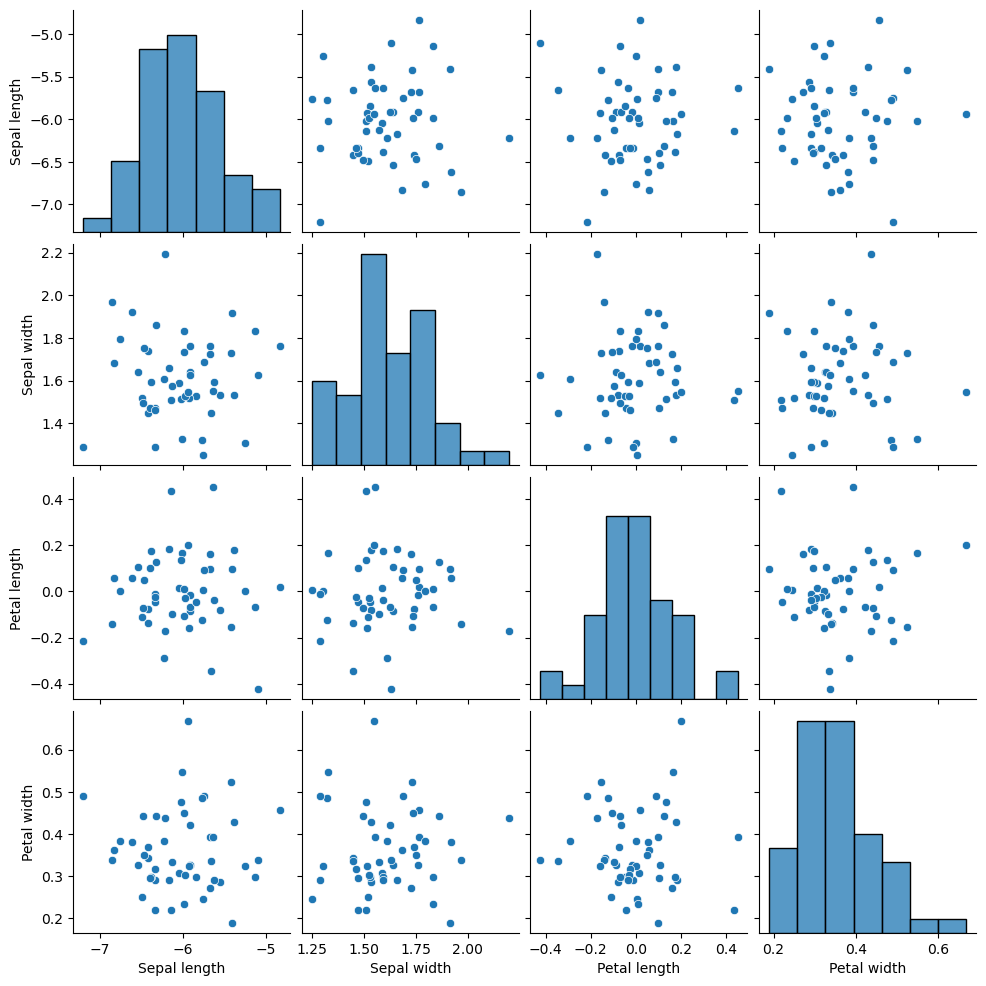

In [41]:
# Using seaborns pairplot with projected data
plt.figure() # Added this to make sure that the figure appear
# Transform the data into a Pandas dataframe
d = pd.DataFrame(data_transform, 
                 columns=['Sepal length', 'Sepal width',
                          'Petal length', 'Petal width'])
sns.pairplot(d)
plt.show()

## Ex2: Camera and Lenses

In [42]:
from math import atan2, pi

# Q1: use trigonometry
def get_theta(a, b):
    return atan2(b, a)

a = 10
b = 3
get_theta(a, b)


0.2914567944778671

In [43]:
# Q2

def camera_b_distance(f, g):
    '''
    Inputs are in mm
    Returns image distance, b, in mm'''
    b = (1/f - 1/g)**-1
    return b

print(camera_b_distance(15, 0.1e3))
print(camera_b_distance(15, 1e3))
print(camera_b_distance(15, 5e3))
print(camera_b_distance(15, 15e3))

# As object distance increases, the distance to CCD tends towards 15mm

17.647058823529413
15.228426395939087
15.045135406218657
15.015015015015017


In [44]:
# Q3.1 thomas image distance
b = camera_b_distance(5, 5e3)
print("Thomas image distance: {:.3f}mm".format(b))

Thomas image distance: 5.005mm


In [45]:
# Q3.2 thomas height on CCD
# b/B = g/G
# B = bG/g
B = b*1.8e3/5e3
print("Thomas image height: {:.3f}mm".format(B))

Thomas image height: 1.802mm


In [46]:
# Q3.3 size of pixel in mm
pixel_size = 6.4 / 640
print("Pixel size: {}mm".format(pixel_size))

Pixel size: 0.01mm


In [47]:
# Q3.4 Height in pixels
print("Thomas pixels: {:.3f}".format(B/pixel_size))

Thomas pixels: 180.180


In [48]:
# Q3.5 and Q3.6 Field of view
# tan(theta/2) = B /f
v_FOV = get_theta(B, 15)*2 # radians
v_FOV = 180.0 / pi * v_FOV
print("Vertial FOV: {:.3f} deg".format(v_FOV))

h_FOV = 640/480*v_FOV
print("Horizontal FOV: {:.3f} deg".format(h_FOV))

Vertial FOV: 166.301 deg
Horizontal FOV: 221.735 deg


## Ex3: Pixelwise Operations

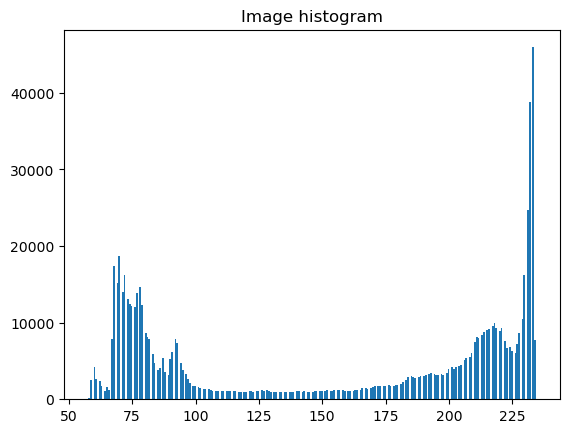

In [49]:
from skimage import color, io, measure, img_as_ubyte, img_as_float
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
import matplotlib.pyplot as plt
import numpy as np

in_dir = "data/"
im_name = "vertebra.png"

im_org = io.imread(in_dir + im_name)
plt.hist(im_org.ravel(), bins=256)
plt.title('Image histogram')
io.show()

# Histogram is bimodal

min value:  57
max value:  235


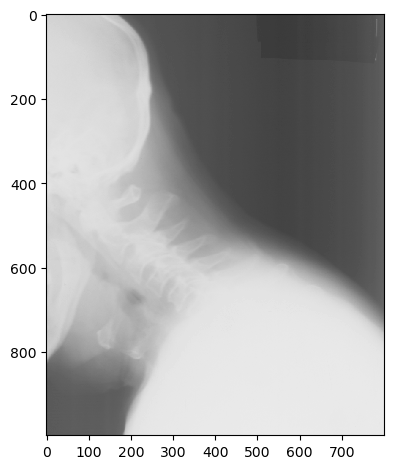

In [50]:
io.imshow(im_org)
print("min value: ", im_org.min())
print("max value: ", im_org.max())
# full scale of gray-scale spectrum is not used
# picture can be further enhanced

In [51]:
im_float = img_as_float(im_org)
print("min value: ", min(im_float.ravel()))
print("max value: ", max(im_float.ravel()))
print("rescaled min value: ", im_float.min()*255)
print("rescaled max value: ", im_float.max()*255)
# verfified that float img = original img

min value:  0.22352941176470587
max value:  0.9215686274509803
rescaled min value:  56.99999999999999
rescaled max value:  235.0


In [52]:
im_byte = img_as_ubyte(im_float)
print("min value: ", min(im_byte.ravel()))
print("max value: ", max(im_byte.ravel()))
# yes, as expected.

min value:  57
max value:  235


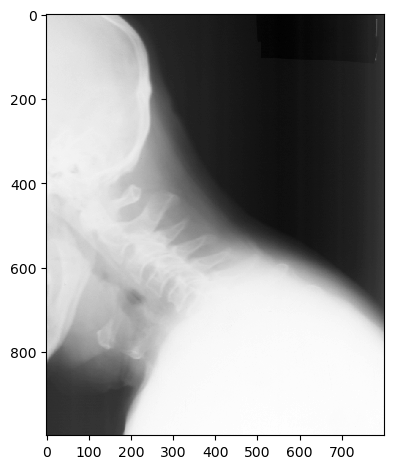

In [53]:
def histogram_stretch(img_in):
    """
    Stretches the histogram of an image 
    :param img_in: Input image
    :return: Image, where the histogram is stretched so the min values is 0 and the maximum value 255
    """
    # img_as_float will divide all pixel values with 255.0
    img_float = img_as_float(img_in)
    min_val = img_float.min()
    max_val = img_float.max()
    min_desired = 0.0
    max_desired = 1.0

    # Do something here
    img_out = img_float
    for i in range(img_in.shape[0]):
        for j in range(img_in.shape[1]):
            new = (img_float[i,j] - min_val)*(max_desired - min_desired)/(max_val - min_val) + min_desired
            img_out[i,j] = new
    
    # img_as_ubyte will multiply all pixel values with 255.0 before converting to unsigned byte
    return img_as_ubyte(img_out)

im_stretched = histogram_stretch(im_org)
io.imshow(im_stretched)


In [54]:
print(im_org.shape[0],im_org.shape[1])


998 800


In [55]:
def gamma_map(img_in, gamma):
    """
    Apply gamma mapping to an image 
    :param img_in: Input image, gamma value
    :return: Image, with gamma mapping applied
    """
    # img_as_float will divide all pixel values with 255.0
    img_float = img_as_float(img_in)
   
    # Do something here
    img_out = np.power(img_float,np.ones(img_float.shape)*gamma)
    
    # img_as_ubyte will multiply all pixel values with 255.0 before converting to unsigned byte
    return img_as_ubyte(img_out)


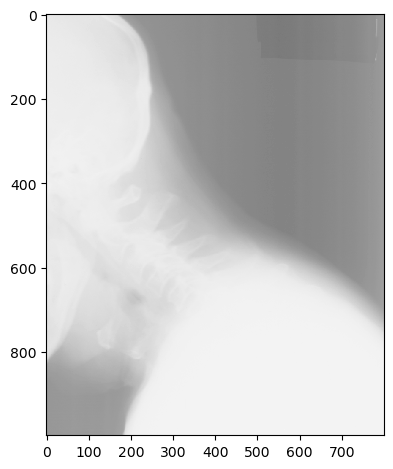

In [56]:
im_gamma = gamma_map(im_org, 0.5)
io.imshow(im_gamma)

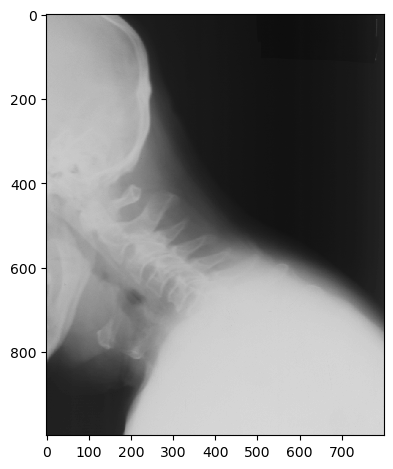

In [57]:
im_gamma = gamma_map(im_org, 2)
io.imshow(im_gamma)

In [58]:
def threshold_image(img_in, thres):
    """
    Apply a threshold in an image and return the resulting image
    :param img_in: Input image
    :param thres: The treshold value in the range [0, 255]
    :return: Resulting image (unsigned byte) where background is 0 and foreground is 255
    """
    img_out = img_in > thres
    
    return img_as_ubyte(img_out)


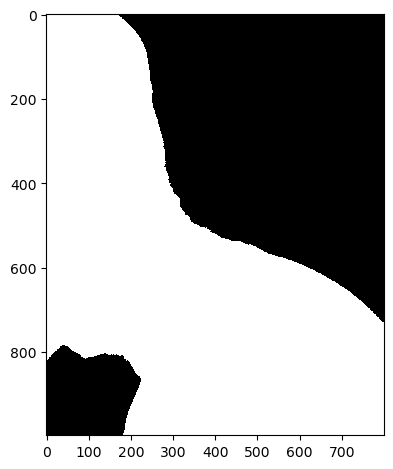

In [59]:
im_thres = threshold_image(im_org, 145)
io.imshow(im_thres)

Otsu Threshold:  148


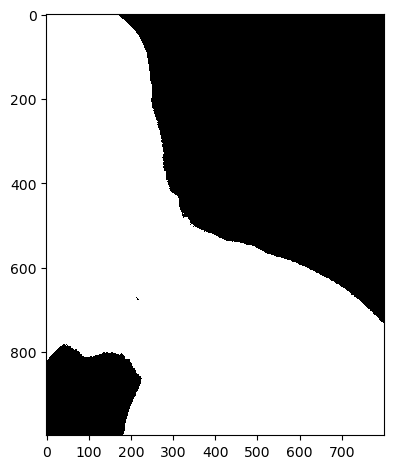

In [60]:
print("Otsu Threshold: ", threshold_otsu(im_org))
im_thres = threshold_image(im_org, threshold_otsu(im_org))
io.imshow(im_thres)

In [61]:
def silhouette(img_in, threshold):
    """
    Convert RGB img to a gray silhouette image
    :param img_in: Input image, threshold in [0,255]
    :param thres: The treshold value in the range [0, 255]
    :return: Resulting image (unsigned byte) where background is 0 and foreground is 255
    """
    img_gray = rgb2gray(img_in)
#     print(img_gray.min(), img_gray.max())
    img_out = threshold_image(img_gray, threshold/255)
    return img_as_ubyte(img_out)

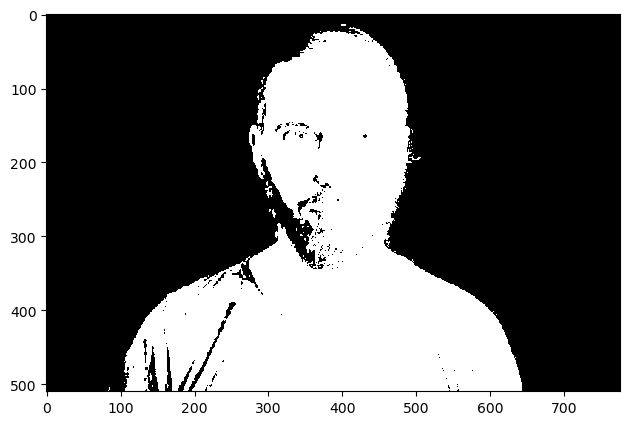

In [62]:
im_name = "dark_background.png"
im_org = io.imread(in_dir + im_name)

im_sil = silhouette(im_org, 10)
io.imshow(im_sil)

C:\Users\yufan\anaconda3\envs\course02502\lib\site-packages\skimage\io\_plugins\matplotlib_plugin.py:150: UserWarning: Low image data range; displaying image with stretched contrast.
  lo, hi, cmap = _get_display_range(image)


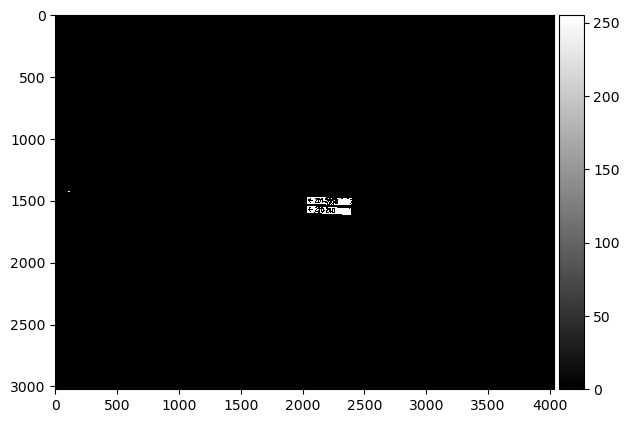

In [63]:
def detect_dtu_signs(img_in, color):
    r_comp = img_in[:, :, 0]
    g_comp = img_in[:, :, 1]
    b_comp = img_in[:, :, 2]
    
    if color == 'blue':
        segm = (r_comp < 10) & (g_comp > 85) & (g_comp < 105) & \
                (b_comp > 180) & (b_comp < 200)
    
    if color == 'red':
        segm = (r_comp > 160) & (r_comp < 180) & (g_comp > 50) & (g_comp < 80) & \
                    (b_comp > 50) & (b_comp < 80)
    
    return img_as_ubyte(segm)

im_name = "DTUSigns2.jpg"
im_org = io.imread(in_dir + im_name)
im_sign = detect_dtu_signs(im_org,'red')
io.imshow(im_sign, vmin = 0, vmax = 255, cmap = 'gray')

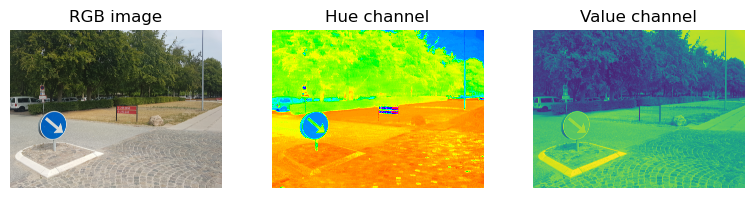

In [64]:
hsv_img = color.rgb2hsv(im_org)
hue_img = hsv_img[:, :, 0]
value_img = hsv_img[:, :, 2]

fig, (ax0, ax1, ax2) = plt.subplots(ncols=3, figsize=(8, 2))
ax0.imshow(im_org)
ax0.set_title("RGB image")
ax0.axis('off')
ax1.imshow(hue_img, cmap='hsv')
ax1.set_title("Hue channel")
ax1.axis('off')
ax2.imshow(value_img)
ax2.set_title("Value channel")
ax2.axis('off')

fig.tight_layout()
io.show()

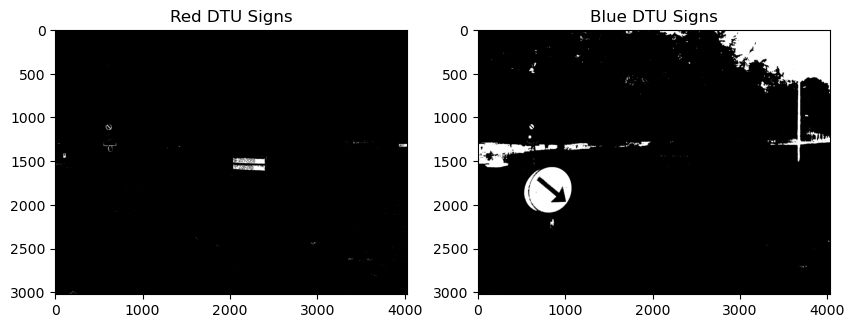

In [65]:
def detect_dtu_signs_hsv(img_in, c):
    hsv_img = color.rgb2hsv(img_in)
    hue_img = hsv_img[:, :, 0]
    
    if c == 'blue':
        segm = (hue_img > 150/360) & (hue_img < 240/360)
    
    if c == 'red':
        segm = (hue_img > 320/360) & (hue_img < 360/360)
    
    return img_as_ubyte(segm)

fig, (ax1, ax2) = plt.subplots(1,2,figsize = (10,5))

im_red_sign = detect_dtu_signs_hsv(im_org, 'red')
ax1.imshow(im_red_sign, cmap = 'gray')
ax1.set_title('Red DTU Signs')


im_blue_sign = detect_dtu_signs_hsv(im_org, 'blue')
ax2.imshow(im_blue_sign, cmap = 'gray')
ax2.set_title('Blue DTU Signs')

plt.show()

## Ex4: Image Filtering

In [66]:
from scipy.ndimage import correlate
import numpy as np
import matplotlib.pyplot as plt
from skimage import io
from skimage.filters import median, gaussian, prewitt_h, \
    prewitt_v, prewitt,threshold_otsu
from skimage import img_as_ubyte
from skimage.color import rgb2gray

input_img = np.arange(25).reshape(5, 5)
print(input_img)

[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]
 [15 16 17 18 19]
 [20 21 22 23 24]]


In [67]:
# Exercise 1
weights = [[0, 1, 0],
		   [1, 2, 1],
		   [0, 1, 0]]
res_img = correlate(input_img, weights)
print(res_img)
print(res_img[3,3])

# correlation: sum of "kernel multiplication"
# 13*1 + 17*1 + 18*2 + 19*1 + 23*1 = 108

[[  6  11  17  23  28]
 [ 31  36  42  48  53]
 [ 61  66  72  78  83]
 [ 91  96 102 108 113]
 [116 121 127 133 138]]
108


In [68]:
# Exercise 2

# set the off-the-edge-pixel to have a constant value
# default mode is reflection padding
res_img = correlate(input_img, weights, mode="constant", cval=10)
print(res_img)

# the elements are only different along the borders

[[ 26  20  25  30  40]
 [ 36  36  42  48  54]
 [ 61  66  72  78  79]
 [ 86  96 102 108 104]
 [ 96 110 115 120 110]]


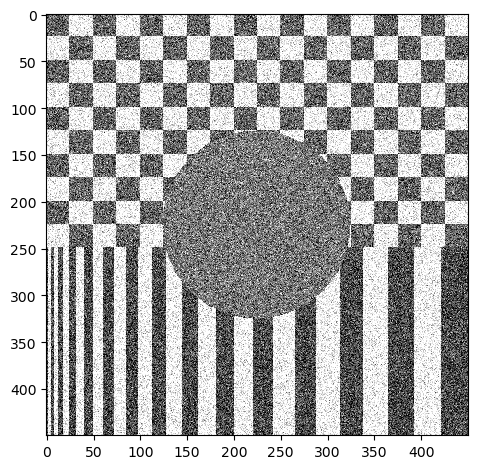

In [69]:
# Exercise 3
# mean filtering
im_dir = "data/"
im_name = "Gaussian.png"
input_img = io.imread(im_dir + im_name)
io.imshow(input_img)

size = 5
# Two dimensional filter filled with 1
weights = np.ones([size, size])
# Normalize weights
weights = weights / np.sum(weights)
# print(weights)
res_img = correlate(input_img, weights)
# io.imshow(res_img)

In [70]:
# print(weights)

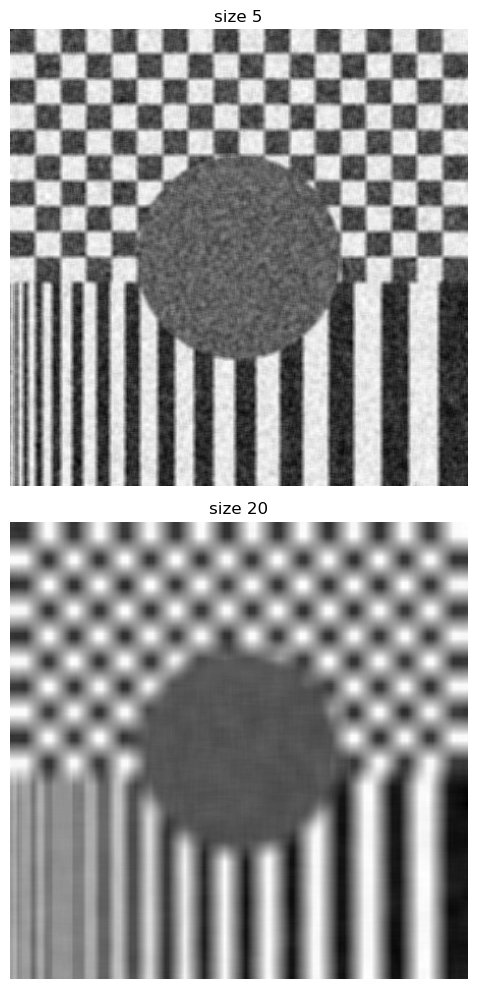

In [71]:
fig, (ax0, ax1) = plt.subplots(nrows=2, figsize = (10,10))
ax0.set_title("size 5")
ax0.imshow(res_img, cmap='gray')
ax0.axis('off')

size = 20
weights = np.ones([size, size])
weights = weights / np.sum(weights)
res_img = correlate(input_img, weights)

ax1.set_title("size 20")
ax1.imshow(res_img, cmap='gray')
ax1.axis('off')

fig.tight_layout()
io.show()

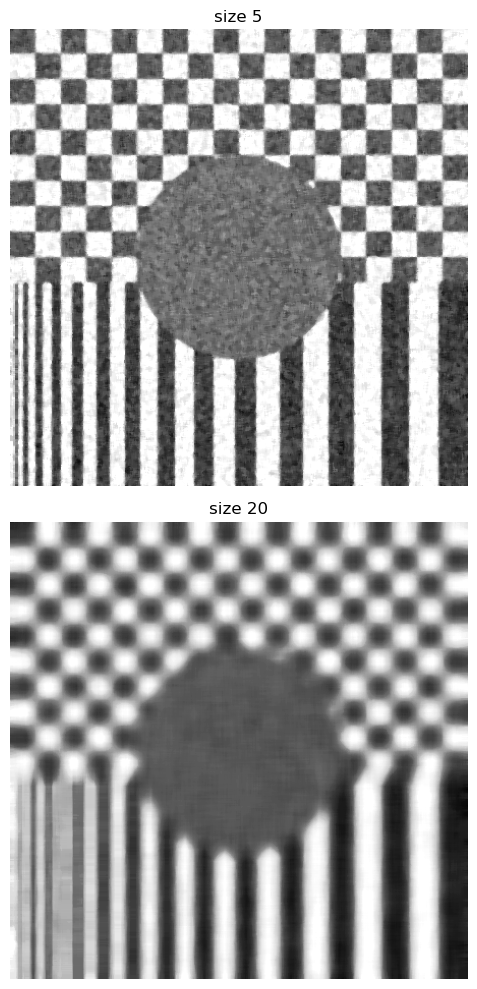

In [72]:
# Exercise 4

size = 5
footprint = np.ones([size, size])
med_img = median(input_img, footprint)

fig, (ax0, ax1) = plt.subplots(nrows=2, figsize = (10,10))
ax0.set_title("size 5")
ax0.imshow(med_img, cmap='gray')
ax0.axis('off')

size = 20
footprint = np.ones([size, size])
med_img = median(input_img, footprint)

ax1.set_title("size 20")
ax1.imshow(med_img, cmap='gray')
ax1.axis('off')

fig.tight_layout()
io.show()

# image becomes is slightly blurred, less noisy
# higher filter size leads to greater blur
# places with transitions from light to dark become grey, visibly blurrer

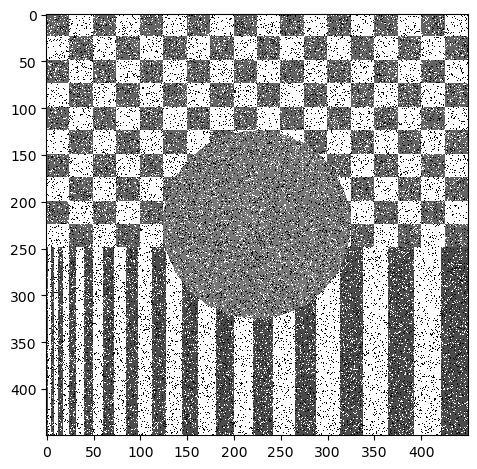

In [73]:
# Exercise 5
im_name = "SaltPepper.png"
input_img = io.imread(im_dir + im_name)
io.imshow(input_img)
io.show()

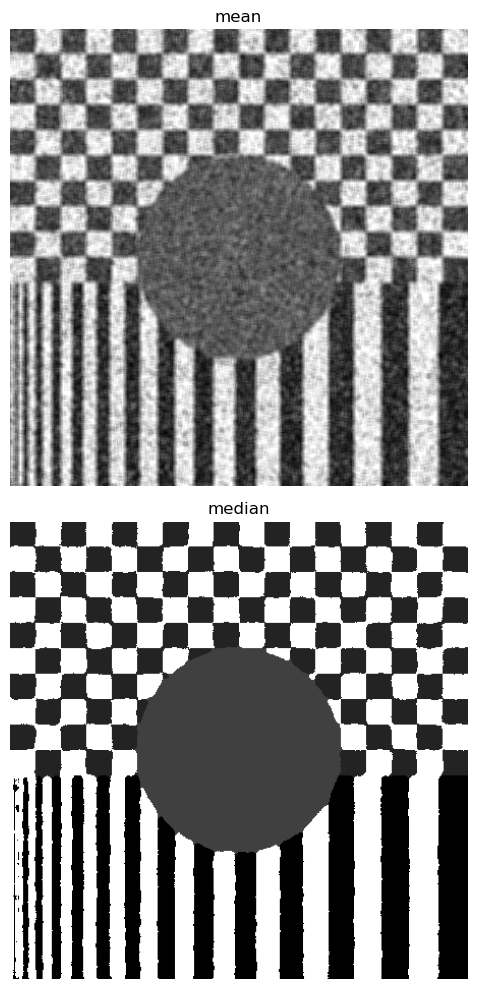

In [74]:
# median filtering
size = 7
footprint = np.ones([size, size])
med_img = median(input_img, footprint)
# io.imshow(med_img)

# mean filtering
size = 5
weights = np.ones([size, size])
weights = weights / np.sum(weights)
mean_img = correlate(input_img, weights)
# io.imshow(res_img)

fig, (ax0, ax1) = plt.subplots(nrows=2, figsize = (10,10))
ax0.set_title("mean")
ax0.imshow(mean_img, cmap='gray')
ax0.axis('off')

ax1.set_title("median")
ax1.imshow(med_img, cmap='gray')
ax1.axis('off')

fig.tight_layout()
io.show()

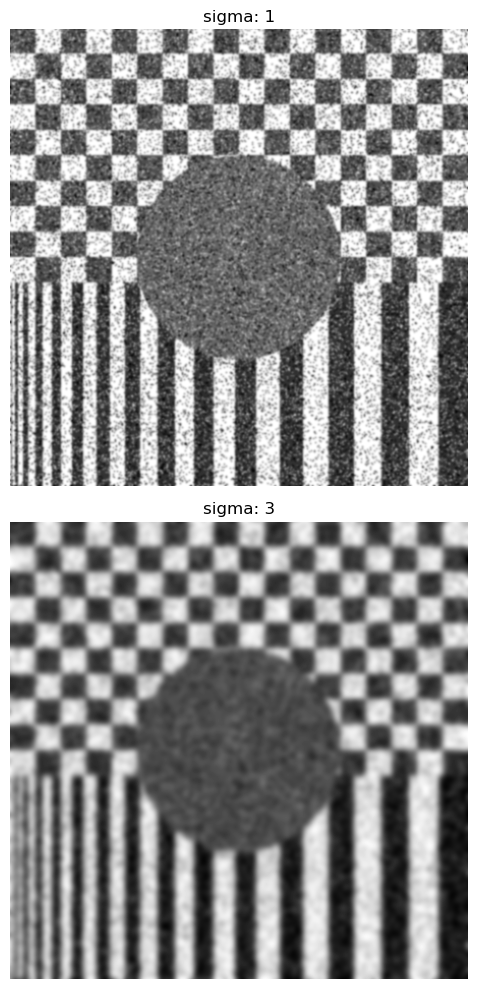

In [75]:
# Exercise 6

sigma = 1   # std of gaussian filter
gauss_img = gaussian(input_img, sigma)

fig, (ax0, ax1) = plt.subplots(nrows=2, figsize = (10,10))
ax0.set_title("sigma: 1")
ax0.imshow(gauss_img, cmap='gray')
ax0.axis('off')

sigma = 3   # std of gaussian filter
gauss_img = gaussian(input_img, sigma)

ax1.set_title("sigma: 3")
ax1.imshow(gauss_img, cmap='gray')
ax1.axis('off')

fig.tight_layout()
io.show()

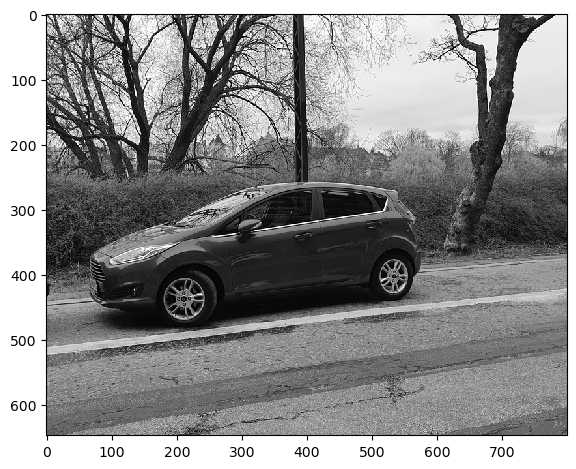

In [76]:
# Exercise 7

im_name = 'car.png'
input_img = io.imread(im_dir + im_name)
img_gray = rgb2gray(input_img)
io.imshow(img_gray)

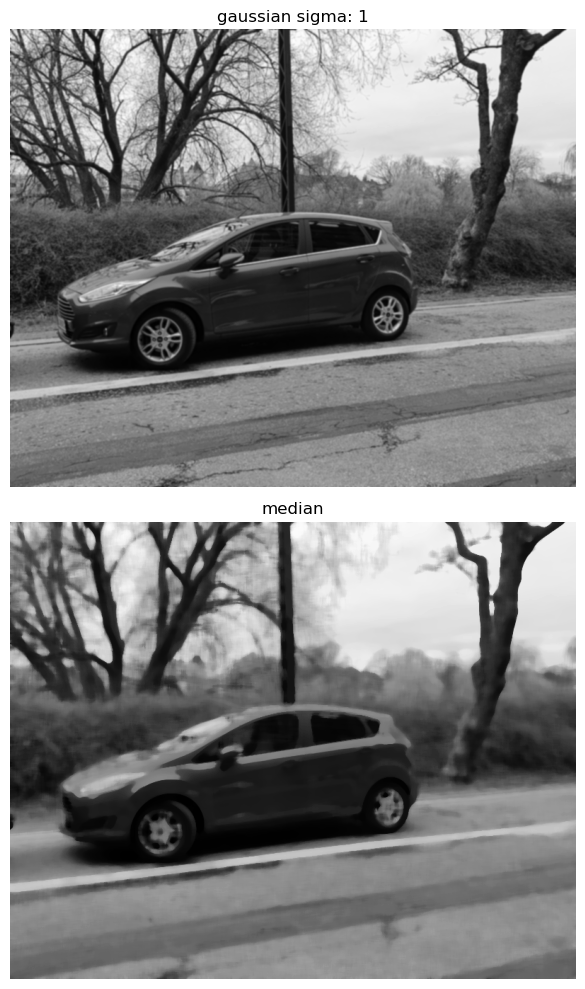

In [77]:
# mean filtering
sigma = 1   # std of gaussian filter
gauss_img = gaussian(img_gray, sigma)

# median filtering
size = 10
footprint = np.ones([size, size])
med_img = median(img_gray, footprint)

fig, (ax0, ax1) = plt.subplots(nrows=2, figsize = (10,10))
ax0.set_title("gaussian sigma: 1")
ax0.imshow(gauss_img, cmap='gray')
ax0.axis('off')

ax1.set_title("median")
ax1.imshow(med_img, cmap='gray')
ax1.axis('off')

fig.tight_layout()
io.show()

# median filter: transition areas have higher contrast,
# more continuous areas of full white and full black
# gaussian filter: smoother colours

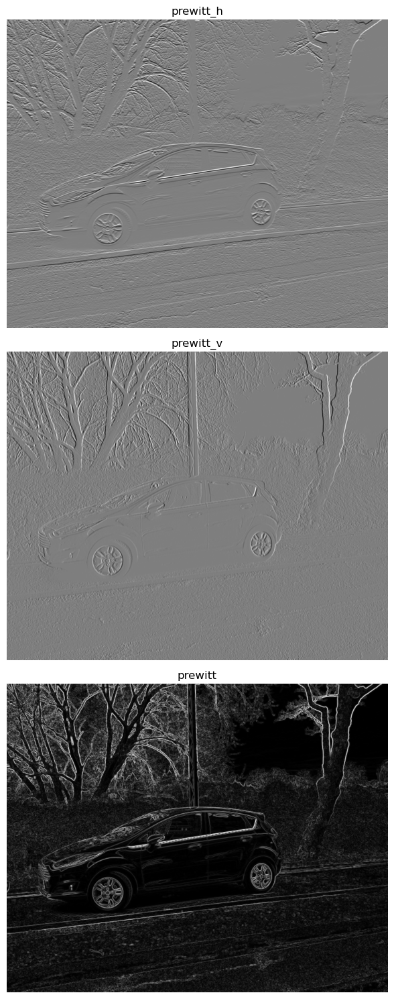

In [78]:
# Exercise 8
# prewitt filter is a simple gradient estimation filter to detect edges

edges_h = prewitt_h(img_gray)
edges_v = prewitt_v(img_gray)
edges = prewitt(img_gray)

fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, figsize = (15,15))
ax0.set_title("prewitt_h")
ax0.imshow(edges_h, cmap='gray')
ax0.axis('off')

ax1.set_title("prewitt_v")
ax1.imshow(edges_v, cmap='gray')
ax1.axis('off')

ax2.set_title("prewitt")
ax2.imshow(edges, cmap='gray')
ax2.axis('off')

fig.tight_layout()
io.show()

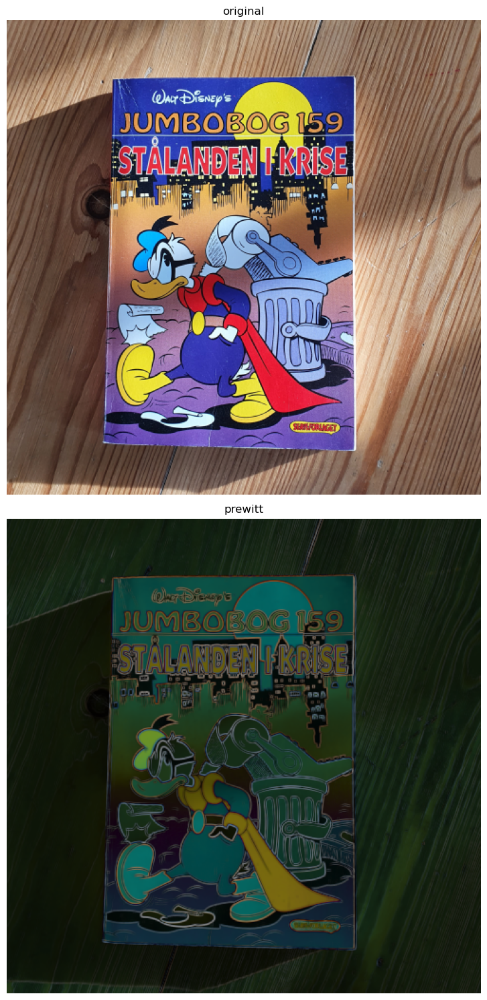

In [79]:
im_name = 'donald_1.png'
input_img = io.imread(im_dir + im_name)
edges = prewitt(input_img)

fig, (ax0, ax1) = plt.subplots(nrows=2, figsize = (15,15))
ax0.set_title("original")
ax0.imshow(input_img, cmap='gray')
ax0.axis('off')

ax1.set_title("prewitt")
ax1.imshow(edges, cmap='gray')
ax1.axis('off')

fig.tight_layout()
io.show()

In [80]:
def threshold_image(img_in, thres):
    """
    Apply a threshold in an image and return the resulting image
    :param img_in: Input image
    :param thres: The treshold value in the range [0, 255]
    :return: Resulting image (unsigned byte) where background is 0 and foreground is 255
    """
    img_out = img_in > thres
    
    return img_as_ubyte(img_out)

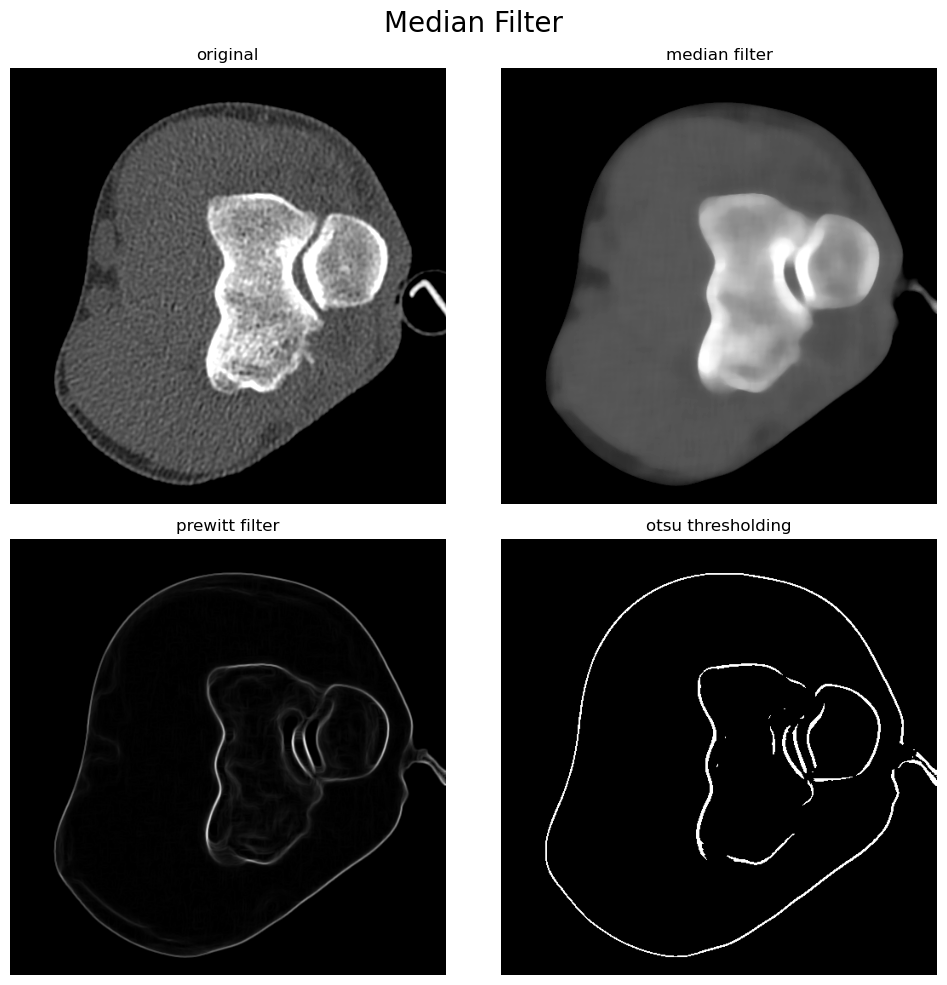

In [81]:
# Exercise 10

im_name = 'ElbowCTSlice.png'
input_img = io.imread(im_dir + im_name)

# median filtering
size = 20
footprint = np.ones([size, size])
med_img = median(input_img, footprint)

# prewitt filter
edge_img = prewitt(med_img)

# otsus thresholding
otsu_thres = threshold_otsu(edge_img)
thres_img = threshold_image(edge_img, otsu_thres)

fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2,
                                             ncols=2,figsize=(10,10))
ax0.set_title("original")
ax0.imshow(input_img, cmap='gray')
ax0.axis('off')

ax1.set_title("median filter")
ax1.imshow(med_img, cmap='gray')
ax1.axis('off')

ax2.set_title("prewitt filter")
ax2.imshow(edge_img, cmap='gray')
ax2.axis('off')

ax3.set_title("otsu thresholding")
ax3.imshow(thres_img, cmap='gray')
ax3.axis('off')

fig.suptitle('Median Filter',fontsize=20)
fig.tight_layout()
io.show()

# median filter seems to outperform mean filter

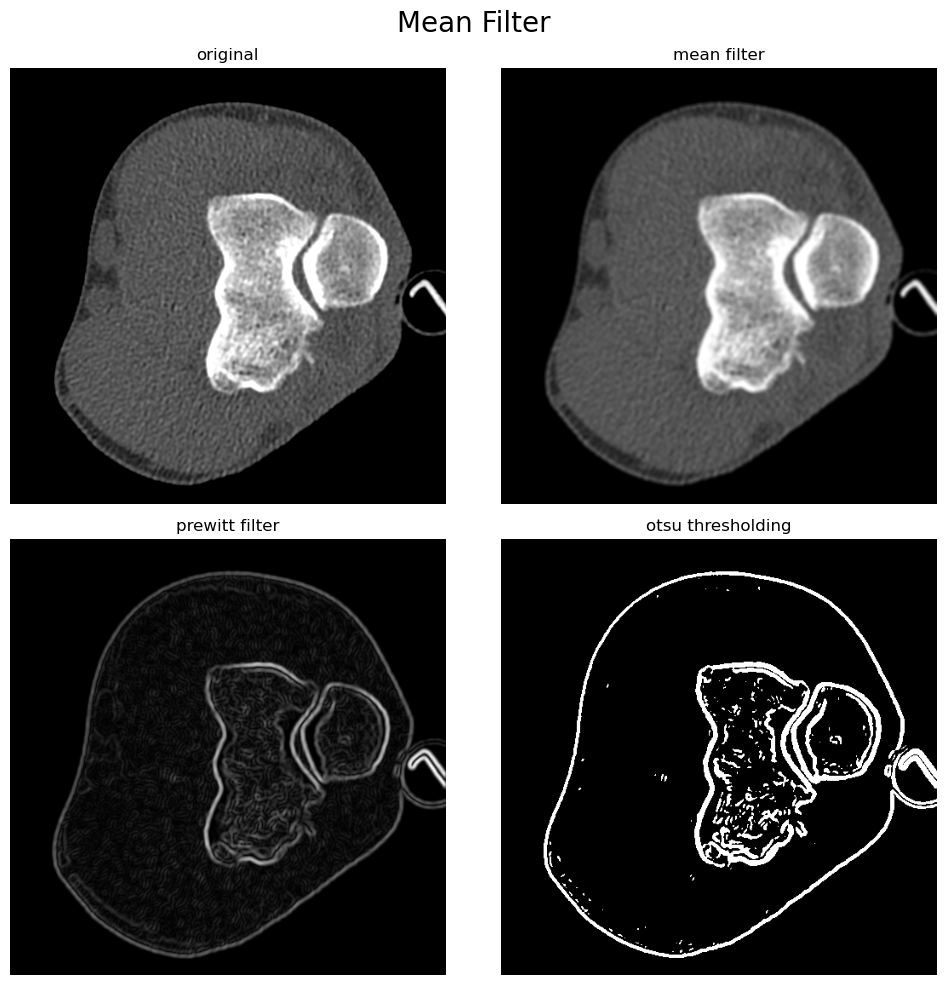

In [82]:
# mean filtering
size = 5
weights = np.ones([size, size])
weights = weights / np.sum(weights)
mean_img = correlate(input_img, weights)

# prewitt filter
edge_img = prewitt(mean_img)

# otsus thresholding
otsu_thres = threshold_otsu(edge_img)
thres_img = threshold_image(edge_img, otsu_thres)

fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2,
                                             ncols=2,figsize=(10,10))
ax0.set_title("original")
ax0.imshow(input_img, cmap='gray')
ax0.axis('off')

ax1.set_title("mean filter")
ax1.imshow(mean_img, cmap='gray')
ax1.axis('off')

ax2.set_title("prewitt filter")
ax2.imshow(edge_img, cmap='gray')
ax2.axis('off')

ax3.set_title("otsu thresholding")
ax3.imshow(thres_img, cmap='gray')
ax3.axis('off')

fig.suptitle('Mean Filter', fontsize=20)
fig.tight_layout()
io.show()

# larger filter size results in less noise, but more and thicker edges

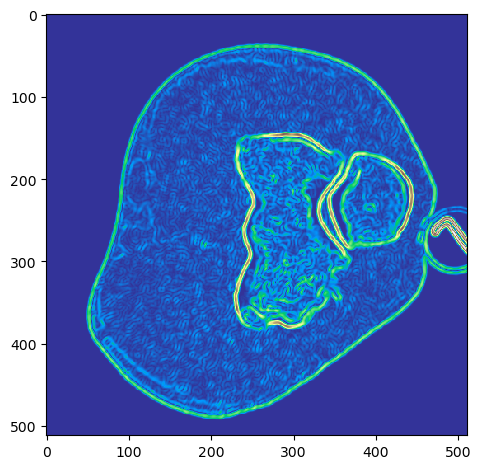

In [83]:
min_val = edge_img.min()
max_val = edge_img.max()
io.imshow(edge_img, vmin=min_val, vmax=max_val, cmap="terrain")
io.show()